# Presentacion

Este proyecto se centra en una base de datos que analizaremos para determinar el estado de los clientes de una empresa telefónica en relación con su actividad en los servicios ofrecidos. El objetivo es clasificar a los clientes como activos, inactivos o en otro estado.

# IMPORTAMOS LIBRERIAS

Importamos las librerias que vamos a ultilizar durante el trabajo

In [2]:
import pandas as pd
datos = pd.read_csv('/content/drive/MyDrive/telecom_customer_churn.csv')
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold, cross_validate
import numpy as np
from sklearn.model_selection import learning_curve
from sklearn.preprocessing import Normalizer
import lightgbm as lgb
import joblib
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import confusion_matrix
datos

,Customer ID,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,...,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Customer Status,Churn Category,Churn Reason
0,0002-ORFBO,Female,37,Yes,0,Frazier Park,93225,34.827662,-118.999073,2,...,Credit Card,65.60,593.30,0.00,0,381.51,974.81,Stayed,NaN,NaN
1,0003-MKNFE,Male,46,No,0,Glendale,91206,34.162515,-118.203869,0,...,Credit Card,-4.00,542.40,38.33,10,96.21,610.28,Stayed,NaN,NaN
2,0004-TLHLJ,Male,50,No,0,Costa Mesa,92627,33.645672,-117.922613,0,...,Bank Withdrawal,73.90,280.85,0.00,0,134.60,415.45,Churned,Competitor,Competitor had better devices
3,0011-IGKFF,Male,78,Yes,0,Martinez,94553,38.014457,-122.115432,1,...,Bank Withdrawal,98.00,1237.85,0.00,0,361.66,1599.51,Churned,Dissatisfaction,Product dissatisfaction
4,0013-EXCHZ,Female,75,Yes,0,Camarillo,93010,34.227846,-119.079903,3,...,Credit Card,83.90,267.40,0.00,0,22.14,289.54,Churned,Dissatisfaction,Network reliability
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,9987-LUTYD,Female,20,No,0,La Mesa,91941,32.759327,-116.997260,0,...,Credit Card,55.15,742.90,0.00,0,606.84,1349.74,Stayed,NaN,NaN
7039,9992-RRAMN,Male,40,Yes,0,Riverbank,95367,37.734971,-120.954271,1,...,Bank Withdrawal,85.10,1873.70,0.00,0,356.40,2230.10,Churned,Dissatisfaction,Product dissatisfaction
7040,9992-UJOEL,Male,22,No,0,Elk,95432,39.108252,-123.645121,0,...,Credit Card,50.30,92.75,0.00,0,37.24,129.99,Joined,NaN,NaN
7041,9993-LHIEB,Male,21,Yes,0,Solana Beach,92075,33.001813,-117.263628,5,...,Credit Card,67.85,4627.65,0.00,0,142.04,4769.69,Stayed,NaN,NaN


# INFORMACION

In [3]:
datos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 38 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Customer ID                        7043 non-null   object 
 1   Gender                             7043 non-null   object 
 2   Age                                7043 non-null   int64  
 3   Married                            7043 non-null   object 
 4   Number of Dependents               7043 non-null   int64  
 5   City                               7043 non-null   object 
 6   Zip Code                           7043 non-null   int64  
 7   Latitude                           7043 non-null   float64
 8   Longitude                          7043 non-null   float64
 9   Number of Referrals                7043 non-null   int64  
 10  Tenure in Months                   7043 non-null   int64  
 11  Offer                              3166 non-null   objec

Verificamos la cantidad de datos nulos

In [4]:
datos.isnull().sum()

,0
Customer ID,0
Gender,0
Age,0
Married,0
Number of Dependents,0
City,0
Zip Code,0
Latitude,0
Longitude,0
Number of Referrals,0


<Axes: title={'center': 'Datos faltantes'}>

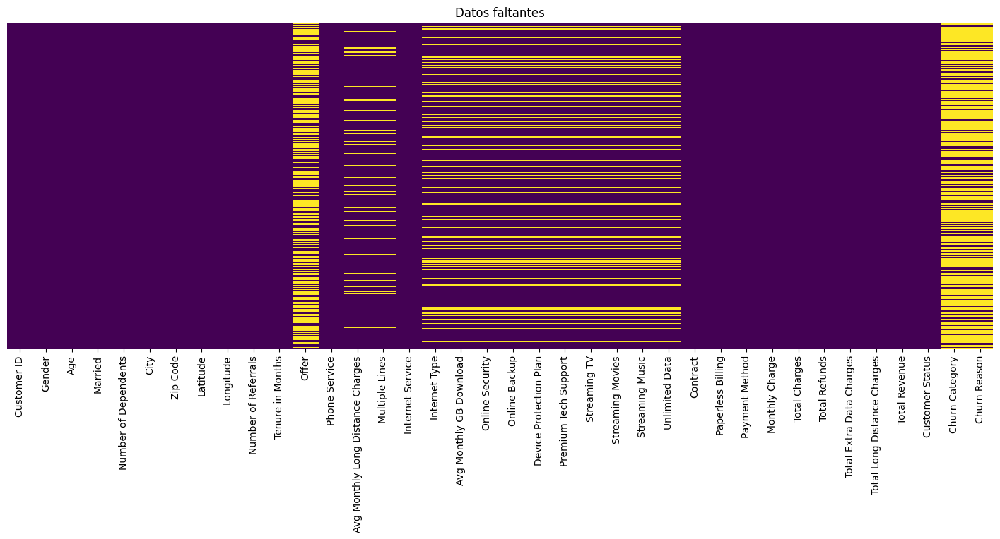

In [5]:
plt.figure(figsize=(18,6))
plt.title('Datos faltantes')
sns.heatmap(datos.isnull(),yticklabels=False,cbar=False,cmap='viridis')

En el gráfico anterior, las filas resaltadas en color morado representan aquellas que contienen valores completos. Las filas que no cumplen con esta condición se muestran en amarillo. Aquellas variables que tienen un número significativo de valores faltantes serán eliminadas del análisis, ya que su falta de datos no aporta valor para nuestro análisis.

In [6]:
duplicados_id = datos['Customer ID']
duplicados_id.duplicated().sum()

0

# INGENIERIA DE VARIABLES




In [7]:
maximo=datos['Total Charges'].max()
print("El precio maximo de la cuota mensual es de: ",maximo)
print()
minimo=datos['Total Charges'].min()
print("El precio minimo de la cuota mensual es de: ",minimo)
print()
promedio=datos['Total Charges'].mean()
print("El precio promedio de la cuota mensual es de: ",promedio)

El precio maximo de la cuota mensual es de:  8684.8

El precio minimo de la cuota mensual es de:  18.8

El precio promedio de la cuota mensual es de:  2280.3812636660514


Se crean 'etiquetas' de la columna de 'Total Charges', en base a los precios de la cuota mensual sacados en la anterior celda. Se le asigna un valor de 1 a los precios igual o menor a 19, un valor de 2 a los precios igual o mayor a 20 y menor o igual a 2300 y un valor de 3 a los precios igual o mayores a 2301

In [8]:
datos['Total Charges Categorical'] = pd.NA

# Asignar categorías
datos.loc[(datos['Total Charges'] > 0) & (datos['Total Charges'] <= 19.99), 'Total Charges Categorical'] = 0
datos.loc[(datos['Total Charges'] >= 20) & (datos['Total Charges'] <= 2999), 'Total Charges Categorical'] = 1
datos.loc[datos['Total Charges'] >= 2300, 'Total Charges Categorical'] = 2

# Verificar valores únicos en la nueva columna
pagos = datos['Total Charges Categorical'].unique()
datos = datos.drop(['Total Charges'], axis=1)
print(pagos)

[1 2 0]


In [9]:
maximo=datos['Total Refunds'].max()
print("El precio maximo de reembolso es de: ",maximo)
print()
minimo=datos['Total Refunds'].min()
print("El precio minimo de reembolso es de: ",minimo)
print()
promedio=datos['Total Refunds'].mean()
print("El precio promedio de reembolso de: ",promedio)

El precio maximo de reembolso es de:  49.79

El precio minimo de reembolso es de:  0.0

El precio promedio de reembolso de:  1.9621823086752803


Se crean 'etiquetas' de la columna de 'Total Refunds', en base a los precios de reembolso sacados en la anterior celda. Se le asigna un valor de 1 a los precios igual o menor a 0 e igual a menor a 20, un valor de 2 a los precios igual o mayor a 20.5 y menor o igaul a 31.5 y un valor de 3 a los precios mayores a 31.5

In [10]:
datos.loc[(datos['Total Refunds'] >= 0) & (datos['Total Refunds'] <= 20), 'Total Refunds'] = 1
datos.loc[(datos['Total Refunds'] >= 20.1) & (datos['Total Refunds'] < 31.5), 'Total Refunds'] = 2
datos.loc[datos['Total Refunds'] > 31.5, 'Total Refunds'] = 3
reembolse=datos['Total Refunds'].unique()
print(reembolse)

[1. 3. 2.]


In [11]:
maximo=datos['Age'].max()
print("La edad maxima es de: ",maximo)
print()
minimo=datos['Age'].min()
print("La edad minima es de: ",minimo)
print()
promedio=datos['Age'].mean()
print("La edad promedio es de: ",promedio)

La edad maxima es de:  80

La edad minima es de:  19

La edad promedio es de:  46.50972596904728


Se crean 'etiquetas' de la columna de 'Age', en base a las edades sacadas en la anterior celda. Se le asigna un valor de 1 a las edades igual o mayoar 1 e igual a menor a 19, un valor de 2 a las edades igual o mayor a 20 y menor o igaul a 30, se le ortorga un valor de 3 a las edades igual o mayor a 31 y menor o igual a 59 y por ultimo se le asigna un valor de 4 a las edades  igual o mayor a 60

In [12]:
datos.loc[(datos['Age'] >= 1) & (datos['Age'] <= 19), 'Age'] = 1
datos.loc[(datos['Age'] >= 20) & (datos['Age'] <= 30), 'Age'] = 2
datos.loc[(datos['Age'] >= 31) & (datos['Age'] <= 59), 'Age'] = 3
datos.loc[datos['Age'] >= 60, 'Age'] = 4
edades=datos['Age'].unique()
print(edades)

[3 4 2 1]


Este código toma un conjunto de datos y los agrupa según dos columnas: 'Customer Status' (Estado del cliente) y 'Multiple Lines' (Líneas múltiples). Luego, cuenta la cantidad de registros en cada grupo. A continuación, desagrupa estos resultados y los presenta en un formato tabular. Finalmente, imprime esta tabla que muestra la cantidad de líneas múltiples para cada estado de cliente.

In [13]:
Lineas = datos.groupby(['Customer Status', 'Multiple Lines']).size().unstack()
print("Cantidad de líneas múltiples de acuerdo al Estado del status:")
print(pd.DataFrame(Lineas))
print()

Cantidad de líneas múltiples de acuerdo al Estado del status:
Multiple Lines     No   Yes
Customer Status            
Churned           849   850
Joined            371    45
Stayed           2170  2076



Este código agrupa los datos según la columna 'Number of Dependents' (Número de Dependientes). Luego, cuenta cuántos registros hay para cada cantidad de dependientes. Posteriormente, presenta esta información en forma de tabla, donde las filas representan la cantidad de dependientes y una columna muestra la cantidad de registros asociados a cada cantidad de dependientes. Finalmente, imprime esta tabla que muestra la cantidad de integrantes del núcleo familiar para cada cantidad de dependientes.


In [14]:
Familia = datos.groupby(['Number of Dependents']).size()
print("Cantidad de integrantes de núcleo familiar:")
print(pd.DataFrame(Familia))
print()

Cantidad de integrantes de núcleo familiar:
                         0
Number of Dependents      
0                     5416
1                      553
2                      531
3                      517
4                        9
5                       10
6                        3
7                        2
8                        1
9                        1



El código agrupa los datos según dos criterios: el número de dependientes ('Number of Dependents') y si el cliente tiene múltiples líneas ('Multiple Lines'). Luego, cuenta cuántos registros hay para cada combinación de número de dependientes y líneas múltiples. Después, organiza esta información en una tabla donde las filas representan el número de dependientes y las columnas muestran la cantidad de líneas múltiples. Finalmente, imprime esta tabla que muestra la cantidad de líneas múltiples para cada número de dependientes en el núcleo familiar.

In [15]:
Lineas_Familia = datos.groupby(['Number of Dependents', 'Multiple Lines']).size().unstack()
print("Cantidad de líneas múltiples de acuerdo al núcleo familiar:")
print(pd.DataFrame(Lineas_Familia))
print()

Cantidad de líneas múltiples de acuerdo al núcleo familiar:
Multiple Lines            No     Yes
Number of Dependents                
0                     2566.0  2325.0
1                      282.0   228.0
2                      267.0   207.0
3                      262.0   202.0
4                        3.0     5.0
5                        7.0     2.0
6                        1.0     1.0
7                        1.0     1.0
8                        1.0     NaN



Este fragmento de código agrupa los datos según la categoría de servicio telefónico ('Phone Service'). Luego, cuenta cuántos registros hay para cada categoría, es decir, cuántos clientes tienen el servicio telefónico activado y cuántos no. Después, presenta esta información en una tabla, donde una columna muestra las categorías de servicio telefónico (activo o inactivo) y otra columna muestra la cantidad de registros asociados a cada categoría. Finalmente, imprime esta tabla que muestra la distribución de la cantidad de servicios telefónicos asignados entre los clientes.

In [16]:
Servicio_T = datos.groupby(['Phone Service']).size()
print("Distribucion de la cantidad de servicios telefonicos asignados:")
print(pd.DataFrame(Servicio_T))
print()

Distribucion de la cantidad de servicios telefonicos asignados:
                  0
Phone Service      
No              682
Yes            6361



Este código agrupa los datos según dos criterios: el estado del servicio telefónico ('Phone Service') y si el cliente tiene múltiples líneas ('Multiple Lines'). Luego, cuenta cuántos registros hay para cada combinación de estos dos criterios. Posteriormente, organiza esta información en una tabla donde las filas representan el estado del servicio telefónico (activo o inactivo) y las columnas muestran la cantidad de líneas múltiples. Finalmente, imprime esta tabla que muestra la cantidad de líneas múltiples de acuerdo al estado del servicio telefónico.

In [17]:
Servicio_telefono = datos.groupby(['Phone Service', 'Multiple Lines']).size().unstack()
print("Cantidad de líneas múltiples de acuerdo al servicio telefonico:")
print(pd.DataFrame(Servicio_telefono))

Cantidad de líneas múltiples de acuerdo al servicio telefonico:
Multiple Lines    No   Yes
Phone Service             
Yes             3390  2971


In [18]:
pd.set_option('display.max_rows', None)

datos_filtrados = datos[datos['Phone Service'] == 'No']

datos_filtrados = datos_filtrados[['Multiple Lines', 'Phone Service']]

print("Datos filtrados donde 'Phone Service' es 'No', mostrando las columnas 'Multiple Lines' y 'Phone Service':")
print(datos_filtrados)

Datos filtrados donde 'Phone Service' es 'No', mostrando las columnas 'Multiple Lines' y 'Phone Service':
     Multiple Lines Phone Service
10              NaN            No
14              NaN            No
16              NaN            No
19              NaN            No
25              NaN            No
34              NaN            No
44              NaN            No
68              NaN            No
72              NaN            No
74              NaN            No
78              NaN            No
107             NaN            No
121             NaN            No
122             NaN            No
130             NaN            No
137             NaN            No
138             NaN            No
141             NaN            No
170             NaN            No
172             NaN            No
176             NaN            No
183             NaN            No
184             NaN            No
189             NaN            No
193             NaN            No
219       

In [19]:
maximo=datos['Monthly Charge'].max()
print("El precio maximo de la cuota mensual es de: ",maximo)
print()
minimo=datos['Monthly Charge'].min()
print("El precio minimo de la cuota mensual es de: ",minimo)
print()
promedio=datos['Monthly Charge'].mean()
print("El precio promedio de la cuota mensual es de: ",promedio)

El precio maximo de la cuota mensual es de:  118.75

El precio minimo de la cuota mensual es de:  -10.0

El precio promedio de la cuota mensual es de:  63.59613091012353


Se utiliza el meotodo de 'abs' para transformar los numeros negativos a positivos de la columna de 'Monthly Charge'

In [20]:
datos['Monthly Charge'] = datos['Monthly Charge'].abs()

Costo de cada tipo de internet:
Internet Type  Cable     DSL  Fiber Optic
Monto                                    
1.0             12.0    35.0         47.0
2.0            484.0  1028.0          NaN
3.0            334.0   589.0       2988.0



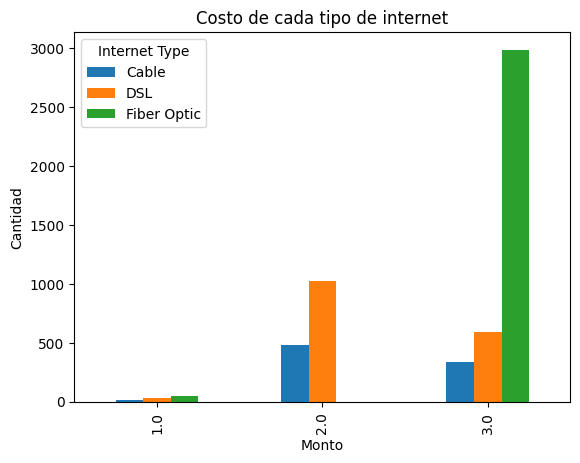

In [21]:
datos.loc[datos['Monthly Charge'] < 19, 'Monto'] = 1
datos.loc[(datos['Monthly Charge'] >= 19) & (datos['Monthly Charge'] <= 64), 'Monto'] = 2
datos.loc[datos['Monthly Charge'] > 64 , 'Monto'] = 3

Precio_internet = datos.groupby(['Monto', 'Internet Type']).size().unstack()
print("Costo de cada tipo de internet:")
print(pd.DataFrame(Precio_internet))
print()

Precio_internet.plot(kind='bar')

plt.title('Costo de cada tipo de internet')
plt.xlabel('Monto')
plt.ylabel('Cantidad')

plt.show()

El gráfico presenta un análisis de la cantidad de usuarios que pagan diferentes montos por tres tipos de servicios de internet: Cable, DSL y Fibra Óptica. Los servicios están representados por colores distintos: azul para Cable, naranja para DSL y verde para Fibra Óptica. En el eje horizontal se observan los montos (1.0, 2.0 y 3.0), mientras que en el eje vertical se muestra la cantidad de usuarios.

La mayor concentración de usuarios de Fibra Óptica se encuentra en el monto más alto (3.0), con casi 3000 usuarios, lo que sugiere una preferencia significativa por este servicio a pesar de su mayor costo. En contraste, los usuarios de DSL muestran una distribución notable entre los montos 2.0 y 3.0, con una cantidad mayor en el monto 2.0. Los usuarios de Cable también están principalmente en los montos 2.0 y 3.0, aunque en menor cantidad comparado con DSL y Fibra Óptica.

Este patrón indica que, aunque la Fibra Óptica es el servicio más costoso, es también el más popular, probablemente debido a sus ventajas en velocidad y confiabilidad. Por otro lado, los servicios de DSL y Cable, aunque más económicos, tienen una base de usuarios más diversificada en términos de costo, con una notable preferencia por DSL en el nivel de costo 2.0.

In [22]:
datos_filtrados = datos[datos['Internet Service'] == 'No']

columnas_seleccionadas = ['Internet Service', 'Internet Type', 'Avg Monthly GB Download',
                          'Online Security', 'Online Backup', 'Device Protection Plan',
                          'Premium Tech Support', 'Streaming TV', 'Streaming Movies',
                          'Streaming Music', 'Unlimited Data']

datos_filtrados = datos_filtrados[columnas_seleccionadas]

print(datos_filtrados)

     Internet Service Internet Type  Avg Monthly GB Download Online Security  \
20                 No           NaN                      NaN             NaN   
23                 No           NaN                      NaN             NaN   
24                 No           NaN                      NaN             NaN   
27                 No           NaN                      NaN             NaN   
28                 No           NaN                      NaN             NaN   
29                 No           NaN                      NaN             NaN   
31                 No           NaN                      NaN             NaN   
33                 No           NaN                      NaN             NaN   
35                 No           NaN                      NaN             NaN   
38                 No           NaN                      NaN             NaN   
42                 No           NaN                      NaN             NaN   
57                 No           NaN     

In [23]:
datos = datos.drop(['Monto'], axis=1)

La datos nulos en las columnas de: 'Avg Monthly Long Distance Charges','Multiple Lines', los datos nulos representan datos mal cargados, ya que en las columna de 'Phone Service' estan cargados con 'No' es decir que que los clientes no rentaron el servicio de telefonia y que por ende a las columnas de 'Avg Monthly Long Distance Charges','Multiple Lines', se le asigna un valor de 'No'. De igual manera sucuede con las columnas de 'Internet Type', 'Avg Monthly GB Download','Online Security', 'Online Backup', 'Device Protection Plan','Premium Tech Support', 'Streaming TV', 'Streaming Movies','Streaming Music', 'Unlimited Data', se presentan datos nulos por que en la columna de 'Internet Service' se le asigna el valor de 'No', es decir que los clientes no solicitaron el servicio de Internet, lo que en consecuencia no soliciten los siguientes servicios:'Internet Type', 'Avg Monthly GB Download','Online Security', 'Online Backup', 'Device Protection Plan','Premium Tech Support', 'Streaming TV', 'Streaming Movies','Streaming Music', 'Unlimited Data', para lo cual se le asigna un valor de 'No' a los datos nulos. En resumen, ante esta situacion se crea una funcion def para que se completen los datos nulos de las columnas antes mencionadas con un valor de 'No'


In [24]:
columnas_seleccionadas = ['Avg Monthly Long Distance Charges','Multiple Lines','Internet Type', 'Avg Monthly GB Download',
                          'Online Security', 'Online Backup', 'Device Protection Plan',
                          'Premium Tech Support', 'Streaming TV', 'Streaming Movies',
                          'Streaming Music', 'Unlimited Data']



def internet(cell):
    if pd.isnull(cell):
        return 'No'
    else:
        return cell

for col in columnas_seleccionadas:
    datos[col] = datos[col].apply(internet)

Para la columna de 'Customer Status' se le asigna un valor de 0 a 'Churned' valor de 1 a 'Joined' y un valor de 2 a 'Stayed'

In [25]:
datos['Customer Status'] = datos['Customer Status'].map({'Stayed': 2, 'Joined': 1, 'Churned': 0})

Se verifica que se hayan completados todos los datos nulos

In [26]:
datos.isnull().sum()

,0
Customer ID,0
Gender,0
Age,0
Married,0
Number of Dependents,0
City,0
Zip Code,0
Latitude,0
Longitude,0
Number of Referrals,0


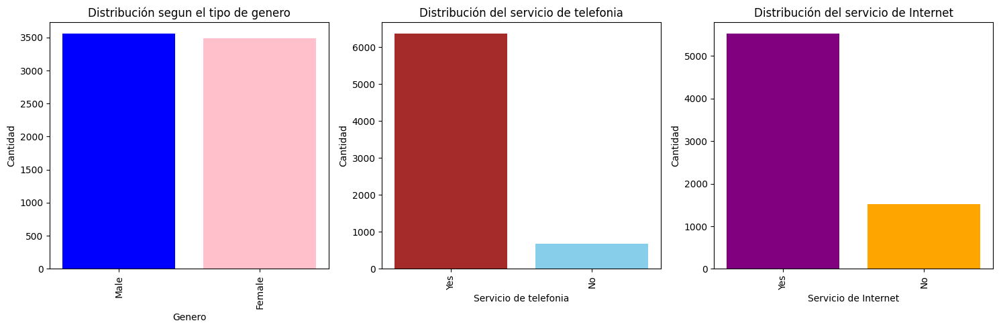

In [27]:
Genero = datos['Gender'].value_counts()
Telefonia = datos['Phone Service'].value_counts()
Internet = datos['Internet Service'].value_counts()

fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].bar(Genero.index, Genero.values, color=['blue', 'Pink'])
axs[0].set_title('Distribución segun el tipo de genero')
axs[0].set_xlabel('Genero')
axs[0].set_ylabel('Cantidad')
axs[0].tick_params(axis='x', rotation=90)

axs[1].bar(Telefonia.index, Telefonia.values, color=['brown','skyblue'])
axs[1].set_title('Distribución del servicio de telefonia')
axs[1].set_xlabel('Servicio de telefonia')
axs[1].set_ylabel('Cantidad')
axs[1].tick_params(axis='x', rotation=90)

axs[2].bar(Internet.index, Internet.values, color=['purple', 'orange'])
axs[2].set_title('Distribución del servicio de Internet')
axs[2].set_xlabel('Servicio de Internet')
axs[2].set_ylabel('Cantidad')
axs[2].tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()

- Distribución según el tipo de género:
Aproximadamente 3500 hombres y 3000 mujeres utilizan los servicios representados. La distribución de género es relativamente equitativa en este contexto.

- Distribución del servicio de telefonía:
El servicio 1 es más popular, con cerca de 6000 usuarios. El servicio 2 tiene menos usuarios, alrededor de 500.

- Distribución del servicio de internet:
El servicio 1 también es más utilizado aquí, con cerca de 5000 personas. El servicio 2 tiene menos usuarios, alrededor de 1500.

En resumen, la mayoría de las personas prefieren el servicio 1 tanto para telefonía como para internet. Además, la distribución de género es bastante equilibrada.

Se acalara que en este grafico se puede visualizar la razon por la cual los clientes decidieron darle de baja al servicio

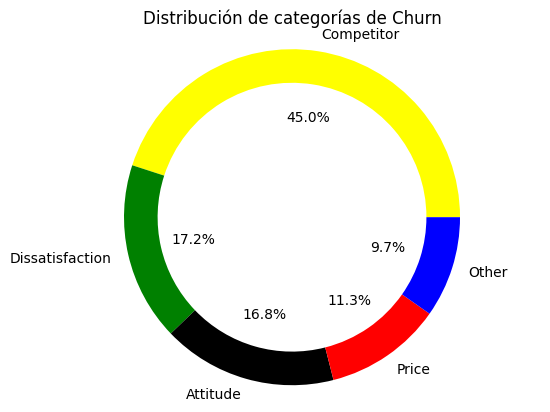

In [28]:
clientes_perdidos = datos[('Churn Category')].value_counts()

plt.pie(clientes_perdidos.values, labels=clientes_perdidos.index, autopct='%1.1f%%', wedgeprops=dict(width=0.2), colors=['yellow', 'green', 'black','red','blue','orange'])
plt.title('Distribución de categorías de Churn')
plt.axis('equal')
plt.show()

Este gráfico muestra la Distribución de categorías de Churn Competitor.

**Insatisfacción (45.0%):** La razón principal por la que los clientes dejaron de usar el servicio es la insatisfacción. Esto representa casi la mitad de los clientes que abandonaron.

**Actitud (17.2%):** La actitud también es un factor significativo, aunque en menor medida que la insatisfacción.

**Precio (16.8%):** El costo también influyó en la decisión de los clientes de dejar de usar el servicio.

**Otras razones (9.7%):** Existen otras razones menos comunes, pero aún relevantes.

En resumen, la insatisfacción es el principal impulsor del abandono del servicio, seguido de la actitud y el precio. Estos hallazgos pueden ayudar a mejorar las estrategias de retención de clientes.

Se eliminan las columna de 'Churn Category','Churn Reason' ya que no aportan ningun valor al analisis de que clientes le dio de baja, ya que son columnas contiene informacion una vez que el cliente ya le haya dado de baja al servicio

In [29]:
datos=datos.drop(['Churn Category','Churn Reason'], axis=1)

In [30]:
datos = datos.applymap(lambda x: str(x) if isinstance(x, float) else x)
enc = LabelEncoder()
for col in datos.columns:
    if datos[col].dtype == 'object':
        datos[col] = enc.fit_transform(datos[col])

<ipython-input-30-e23b5b9caf05>:1: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  datos = datos.applymap(lambda x: str(x) if isinstance(x, float) else x)


Se crea una matriz de correlacion

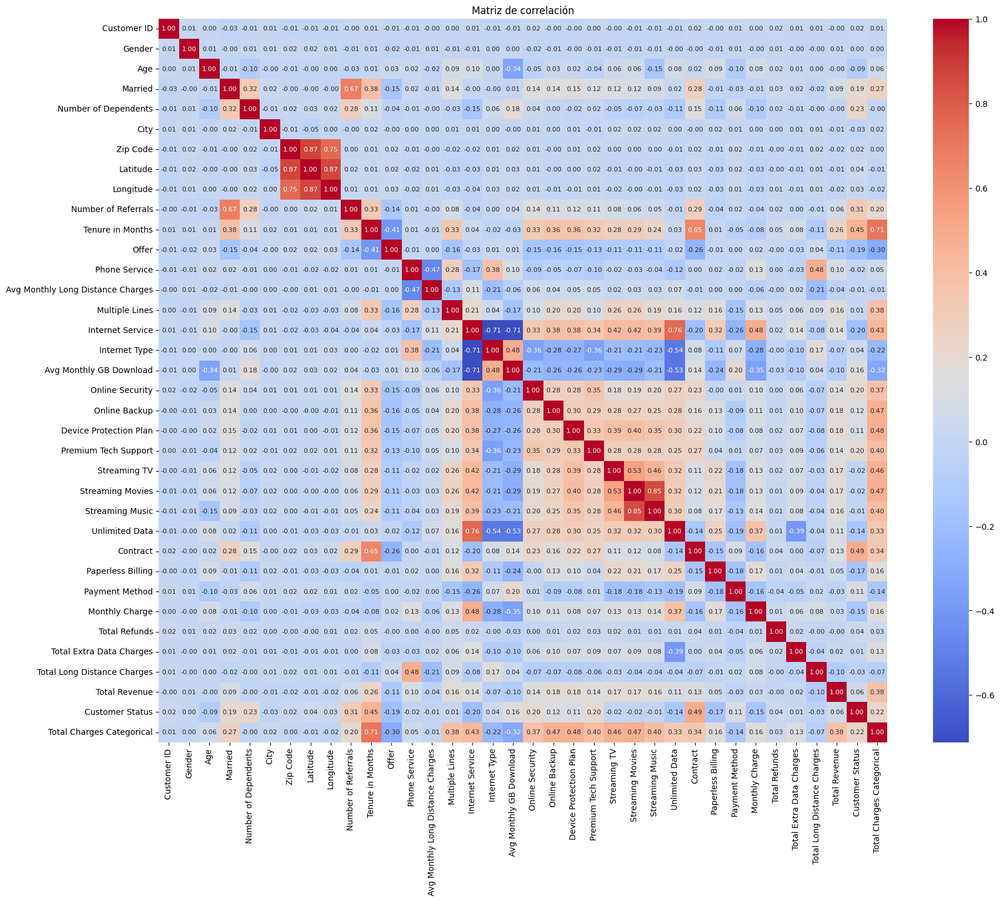

In [31]:
correlacion = datos.corr()

plt.figure(figsize=(20, 16))

sns.heatmap(correlacion, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 8})

plt.title('Matriz de correlación')

plt.show()

Se eliminan las siguientes columnas:
Customer ID: Es el identificador unicos de cada cliente por lo cual, no se puede sacar ninguna conclusion a algun tipo de patron en base a esta columna
'Latitude', 'Longitude', 'Zip Code': En esta coluna se eliminan por que solo aportn informacion no tan importante sobre el domicilio del cliente, ademas ya contamos con la columna de 'City' que aporta el lugar de vivienda de cada cliente
'Total Revenue': Esta columna se elimina por que represente las ganacia de la empresa y no aporta informacion sobre el cliente
'Total Long Distance Charges','Total Extra Data Charges': Esta columna se elimins por que aporta informacion vliosa para la predeccion del trabajo

In [32]:
datos=datos.drop(['Customer ID','Latitude','Longitude','Total Revenue','Zip Code','Total Long Distance Charges','Total Extra Data Charges'], axis=1)

# Se crea un DataFrame para simular el funcionamiento del modelo en produccion

In [33]:
# Filtrar df para obtener solo las filas de Fede y Tania
datos_testeo = datos.tail(500)

# Imprimir información sobre los DataFrames
print("Filas en df_testeo:")
print(datos_testeo)
print("\nFilas restantes en df:")
print(datos)

Se han truncado las últimas 5000 líneas del flujo de salida.
2045                          1  
2046                          1  
2047                          2  
2048                          1  
2049                          1  
2050                          1  
2051                          2  
2052                          1  
2053                          1  
2054                          2  
2055                          1  
2056                          1  
2057                          1  
2058                          1  
2059                          1  
2060                          0  
2061                          1  
2062                          1  
2063                          2  
2064                          1  
2065                          1  
2066                          2  
2067                          2  
2068                          2  
2069                          1  
2070                          1  
2071                          1  
2072                 

In [34]:
datos = datos.drop(datos_testeo.index)

In [35]:
datos

,Gender,Age,Married,Number of Dependents,City,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,...,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Refunds,Customer Status,Total Charges Categorical
0,0,3,1,0,346,2,9,5,1,2666,...,0,0,1,1,1,1,949,0,2,1
1,1,3,0,0,368,0,9,5,1,133,...,1,1,0,0,0,1,548,2,2,1
2,1,3,0,0,222,0,4,4,1,1930,...,0,0,1,0,1,0,1094,0,0,1
3,1,4,1,0,587,1,13,3,1,1437,...,1,0,1,0,1,0,1552,0,0,1
4,0,4,1,0,139,3,3,5,1,3397,...,0,0,1,0,1,1,1283,0,0,1
5,0,2,0,3,608,0,9,4,1,571,...,1,1,1,0,1,1,1011,0,2,1
6,0,4,1,0,546,1,71,0,1,3579,...,1,1,1,2,1,0,184,0,2,2
7,1,3,1,0,653,8,63,1,1,296,...,0,0,0,2,1,1,1298,0,2,2
8,0,4,0,0,924,0,7,4,1,122,...,0,0,1,2,1,0,649,0,2,1
9,0,3,1,1,915,3,65,5,1,1483,...,1,1,1,2,1,1,1412,0,2,2


# División de Datos para Entrenamiento y Prueba Para un Modelo

In [36]:
y = datos['Customer Status']
x = datos.drop(['Customer Status'], axis = 1)

## Normalizacion de los datos

Se escalan los datos en un rango del 0 al 1

In [38]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=123)
transformer = Normalizer().fit(x_train)
x = pd.DataFrame(transformer.transform(x), columns=x.columns)
x

,Gender,Age,Married,Number of Dependents,City,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,...,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Refunds,Total Charges Categorical
0,0.000000,0.001052,0.000351,0.000000,0.121362,0.000702,0.003157,0.001754,0.000351,0.935120,...,0.000351,0.000000,0.000000,0.000351,0.000351,0.000351,0.000351,0.332869,0.000000,0.000351
1,0.001485,0.004455,0.000000,0.000000,0.546434,0.000000,0.013364,0.007424,0.001485,0.197489,...,0.000000,0.001485,0.001485,0.000000,0.000000,0.000000,0.001485,0.813712,0.002970,0.001485
2,0.000448,0.001345,0.000000,0.000000,0.099565,0.000000,0.001794,0.001794,0.000448,0.865588,...,0.000000,0.000000,0.000000,0.000448,0.000000,0.000448,0.000000,0.490649,0.000000,0.000448
3,0.000456,0.001822,0.000456,0.000000,0.267398,0.000456,0.005922,0.001367,0.000456,0.654602,...,0.000456,0.000456,0.000000,0.000456,0.000000,0.000456,0.000000,0.706988,0.000000,0.000456
4,0.000000,0.001101,0.000275,0.000000,0.038251,0.000826,0.000826,0.001376,0.000275,0.934813,...,0.000275,0.000000,0.000000,0.000275,0.000000,0.000275,0.000275,0.353066,0.000000,0.000275
5,0.000000,0.001525,0.000000,0.002288,0.463635,0.000000,0.006863,0.003050,0.000763,0.435420,...,0.000763,0.000763,0.000763,0.000763,0.000000,0.000763,0.000763,0.770945,0.000000,0.000763
6,0.000000,0.001103,0.000276,0.000000,0.150588,0.000276,0.019582,0.000000,0.000276,0.987097,...,0.000276,0.000276,0.000276,0.000276,0.000552,0.000276,0.000000,0.050748,0.000000,0.000552
7,0.000674,0.002021,0.000674,0.000000,0.439804,0.005388,0.042431,0.000674,0.000674,0.199360,...,0.000000,0.000000,0.000000,0.000000,0.001347,0.000674,0.000674,0.874219,0.000000,0.001347
8,0.000000,0.003522,0.000000,0.000000,0.813506,0.000000,0.006163,0.003522,0.000880,0.107411,...,0.000000,0.000000,0.000000,0.000880,0.001761,0.000880,0.000000,0.571391,0.000000,0.000880
9,0.000000,0.001337,0.000446,0.000446,0.407793,0.001337,0.028969,0.002228,0.000446,0.660937,...,0.000446,0.000446,0.000446,0.000446,0.000891,0.000446,0.000446,0.629294,0.000000,0.000891


Empezamos a buscar al mejor modelo de Marchine Learning

In [39]:
skfold_outer = StratifiedKFold(n_splits=8, shuffle=True, random_state=123)

# Creamos los folds internos
skfold_inner = StratifiedKFold(n_splits=8, shuffle=True, random_state=123)

## Random Forest Classifier

In [40]:
param_grid_rf = {
    'max_depth': [8, 10, 40, 20],
    'n_estimators': [15, 20, 8]
}

# Configurar el modelo y el grid search
model_rf = RandomForestClassifier(random_state=123)

grid_search_rf = GridSearchCV(
    estimator=model_rf,
    param_grid=param_grid_rf,
    cv=skfold_inner,
    scoring='accuracy',
    n_jobs=-1,
    verbose=2
)

# Ejecutar la validación cruzada anidada
nested_cv_rf = cross_validate(grid_search_rf, X=x, y=y, cv=skfold_outer, return_train_score=True)

# Convertir los resultados en un DataFrame de pandas
result_cv_rf = pd.DataFrame(nested_cv_rf)

# Calcular el promedio, desviación estándar y mediana del test_score
mean_test_score_rf = result_cv_rf['test_score'].mean()
std_test_score_rf = result_cv_rf['test_score'].std()
median_test_score_rf = result_cv_rf['test_score'].median()

# Imprimir los resultados
print("Promedio del test_score: ", mean_test_score_rf)
print("Desviación estándar del test_score: ", std_test_score_rf)
print("Mediana del test_score: ", median_test_score_rf)

Fitting 8 folds for each of 12 candidates, totalling 96 fits
Fitting 8 folds for each of 12 candidates, totalling 96 fits
Fitting 8 folds for each of 12 candidates, totalling 96 fits
Fitting 8 folds for each of 12 candidates, totalling 96 fits
Fitting 8 folds for each of 12 candidates, totalling 96 fits
Fitting 8 folds for each of 12 candidates, totalling 96 fits
Fitting 8 folds for each of 12 candidates, totalling 96 fits
Fitting 8 folds for each of 12 candidates, totalling 96 fits
Promedio del test_score:  0.813234880429025
Desviación estándar del test_score:  0.012144100764749814
Mediana del test_score:  0.8123471882640587


## DecisionTreeClassifier

In [41]:
# Definir los parámetros para el grid search
param_grid_dt = {
    'max_depth': [1, 2, 5, 8, 7, 30, 6, 80, 100]
}

# Configurar el modelo y el grid search
model_dt = DecisionTreeClassifier(random_state=123)

grid_search_dt = GridSearchCV(
    estimator=model_dt,
    param_grid=param_grid_dt,
    cv=skfold_inner,
    scoring='accuracy',
    n_jobs=-1,
    verbose=2
)


# Ejecutar la validación cruzada anidada
nested_cv_dt = cross_validate(grid_search_dt, X=x, y=y, cv=skfold_outer, return_train_score=True)

# Convertir los resultados en un DataFrame de pandas
result_cv_dt = pd.DataFrame(nested_cv_dt)

# Calcular el promedio, desviación estándar y mediana del test_score
mean_test_score_dt = result_cv_dt['test_score'].mean()
std_test_score_dt = result_cv_dt['test_score'].std()
median_test_score_dt = result_cv_dt['test_score'].median()

# Imprimir los resultados
print("Promedio del test_score: ", mean_test_score_dt)
print("Desviación estándar del test_score: ", std_test_score_dt)
print("Mediana del test_score: ", median_test_score_dt)

Fitting 8 folds for each of 9 candidates, totalling 72 fits
Fitting 8 folds for each of 9 candidates, totalling 72 fits
Fitting 8 folds for each of 9 candidates, totalling 72 fits
Fitting 8 folds for each of 9 candidates, totalling 72 fits
Fitting 8 folds for each of 9 candidates, totalling 72 fits
Fitting 8 folds for each of 9 candidates, totalling 72 fits
Fitting 8 folds for each of 9 candidates, totalling 72 fits
Fitting 8 folds for each of 9 candidates, totalling 72 fits
Promedio del test_score:  0.7814455503915871
Desviación estándar del test_score:  0.01725216453400456
Mediana del test_score:  0.7828726661140256


## LogisticRegression

In [42]:
# Definir los parámetros para el grid search
param_grid_lr = {
    'C': [1.0, 2.0, 3.0, 4.0],
    'max_iter': [10, 8, 19, 25]
}

# Configurar el modelo de regresión logística
model_lr = LogisticRegression(penalty='l2', solver='liblinear', multi_class='ovr', random_state=123)

# Configurar el GridSearchCV
grid_search_lr = GridSearchCV(
    estimator=model_lr,
    param_grid=param_grid_lr,
    cv=skfold_inner,
    scoring='accuracy',
    n_jobs=-1,
    verbose=2
)



# Ejecutar la validación cruzada anidada
nested_cv_lr = cross_validate(grid_search_lr, X=x, y=y, cv=skfold_outer, return_train_score=True)

# Convertir los resultados en un DataFrame de pandas
result_cv_lr = pd.DataFrame(nested_cv_lr)

# Calcular el promedio, desviación estándar y mediana del test_score
mean_test_score_lr = result_cv_lr['test_score'].mean()
std_test_score_lr = result_cv_lr['test_score'].std()
median_test_score_lr = result_cv_lr['test_score'].median()

# Imprimir los resultados
print("Promedio del test_score: ", mean_test_score_lr)
print("Desviación estándar del test_score: ", std_test_score_lr)
print("Mediana del test_score: ", median_test_score_lr)

Fitting 8 folds for each of 16 candidates, totalling 128 fits


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Fitting 8 folds for each of 16 candidates, totalling 128 fits


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Fitting 8 folds for each of 16 candidates, totalling 128 fits


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Fitting 8 folds for each of 16 candidates, totalling 128 fits


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Fitting 8 folds for each of 16 candidates, totalling 128 fits


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Fitting 8 folds for each of 16 candidates, totalling 128 fits


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Fitting 8 folds for each of 16 candidates, totalling 128 fits


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Fitting 8 folds for each of 16 candidates, totalling 128 fits
Promedio del test_score:  0.6775172974655324
Desviación estándar del test_score:  0.004277922346723609
Mediana del test_score:  0.6790953545232274


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


## AdaBoostClassifier

In [43]:
# Definir los parámetros para el grid search
param_grid_ab = {
    'n_estimators': [25, 5, 10],
    'learning_rate': [0.1, 0.2, 0.3],
    'estimator__max_depth': [1, 2, 3] # Change 'base_estimator__' to 'estimator__'
}

# Configurar el modelo base (DecisionTreeClassifier) y el modelo AdaBoost
base_estimator = DecisionTreeClassifier(random_state=123)
# Pass base_estimator as estimator
model_ab = AdaBoostClassifier(estimator=base_estimator, random_state=123)

# Configurar el GridSearchCV
grid_search_ab = GridSearchCV(
    estimator=model_ab,
    param_grid=param_grid_ab,
    cv=skfold_inner,
    scoring='accuracy',
    n_jobs=-1,
    verbose=2
)


# Ejecutar la validación cruzada anidada
nested_cv_ab = cross_validate(grid_search_ab, X=x, y=y, cv=skfold_outer, return_train_score=True)

# Convertir los resultados en un DataFrame de pandas
result_cv_ab = pd.DataFrame(nested_cv_ab)

# Calcular el promedio, desviación estándar y mediana del test_score
mean_test_score_ab = result_cv_ab['test_score'].mean()
std_test_score_ab = result_cv_ab['test_score'].std()
median_test_score_ab = result_cv_ab['test_score'].median()

# Imprimir los resultados
print("Promedio del test_score: ", mean_test_score_ab)
print("Desviación estándar del test_score: ", std_test_score_ab)
print("Mediana del test_score: ", median_test_score_ab)

Fitting 8 folds for each of 27 candidates, totalling 216 fits
Fitting 8 folds for each of 27 candidates, totalling 216 fits
Fitting 8 folds for each of 27 candidates, totalling 216 fits
Fitting 8 folds for each of 27 candidates, totalling 216 fits
Fitting 8 folds for each of 27 candidates, totalling 216 fits
Fitting 8 folds for each of 27 candidates, totalling 216 fits
Fitting 8 folds for each of 27 candidates, totalling 216 fits
Fitting 8 folds for each of 27 candidates, totalling 216 fits
Promedio del test_score:  0.8055965381127806
Desviación estándar del test_score:  0.014411061186954066
Mediana del test_score:  0.8080684596577017


## KNN

In [44]:
# Definir los parámetros para el grid search
param_grid_knn = {
    'n_neighbors': [120, 100, 80, 50, 25, 12, 6, 10, 7, 8, 9]
}

# Configurar el modelo y el grid search
model_knn = KNeighborsClassifier()

grid_search_knn = GridSearchCV(
    estimator=model_knn,
    param_grid=param_grid_knn,
    cv=skfold_inner,
    scoring='accuracy',
    n_jobs=-1,
    verbose=2
)

# Ejecutar la validación cruzada anidada
nested_cv_knn = cross_validate(grid_search_knn, X=x, y=y, cv=skfold_outer, return_train_score=True)

# Convertir los resultados en un DataFrame de pandas
result_cv_knn = pd.DataFrame(nested_cv_knn)

# Calcular el promedio, desviación estándar y mediana del test_score
mean_test_score_knn = result_cv_knn['test_score'].mean()
std_test_score_knn = result_cv_knn['test_score'].std()
median_test_score_knn = result_cv_knn['test_score'].median()

# Imprimir los resultados
print("Promedio del test_score: ", mean_test_score_knn)
print("Desviación estándar del test_score: ", std_test_score_knn)
print("Mediana del test_score: ", median_test_score_knn)

Fitting 8 folds for each of 11 candidates, totalling 88 fits
Fitting 8 folds for each of 11 candidates, totalling 88 fits
Fitting 8 folds for each of 11 candidates, totalling 88 fits
Fitting 8 folds for each of 11 candidates, totalling 88 fits
Fitting 8 folds for each of 11 candidates, totalling 88 fits
Fitting 8 folds for each of 11 candidates, totalling 88 fits
Fitting 8 folds for each of 11 candidates, totalling 88 fits
Fitting 8 folds for each of 11 candidates, totalling 88 fits
Promedio del test_score:  0.6697248341328672
Desviación estándar del test_score:  0.009733493458487378
Mediana del test_score:  0.6693154034229829


## LightGBM

In [49]:
# Parámetros para LightGBM
param_grid_lgbm = {
    'n_estimators': [15, 10, 20],
    'max_depth': [-1],
    'learning_rate': [0.1, 0.2, 0.3]
}

# Definir el modelo LGBMClassifier
# Change objective to 'multiclass' since your target has more than 2 classes
model_lgbm = lgb.LGBMClassifier(objective='multiclass', metric='multi_logloss', boosting_type='gbdt', verbose = 0)

# You need to specify the number of classes in your target variable
model_lgbm.set_params(num_class=len(np.unique(y))) # Assuming y is your target variable


# Configurar la búsqueda en cuadrícula con validación cruzada
grid_search_lgbm = GridSearchCV(
    estimator=model_lgbm,
    param_grid=param_grid_lgbm,
    cv=skfold_inner,  # Suponiendo que skfold_inner ya está definido
    scoring='accuracy',
    n_jobs=-1,
    verbose=2
)

# Realizar la validación cruzada anidada con cross_validate
nested_cv_lgbm = cross_validate(grid_search_lgbm, X=x, y=y, cv=skfold_outer, return_train_score=True)

# Convertir los resultados a DataFrame para un análisis más fácil
result_cv_lgbm = pd.DataFrame(nested_cv_lgbm)

# Calcular estadísticas del test_score
mean_test_score_lgbm = result_cv_lgbm['test_score'].mean()
std_test_score_lgbm = result_cv_lgbm['test_score'].std()
median_test_score_lgbm = result_cv_lgbm['test_score'].median()

# Imprimir los resultados
print("Promedio del test_score: ", mean_test_score_lgbm)
print("Desviación estándar del test_score: ", std_test_score_lgbm)
print("Mediana del test_score: ", median_test_score_lgbm)

Fitting 8 folds for each of 9 candidates, totalling 72 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
Fitting 8 folds for each of 9 candidates, totalling 72 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
Fitting 8 folds for each of 9 candidates, totalling 72 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
Fitting 8 folds for each of 9 candidates, totalling 72 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
Fitting 8 folds for each of 9 candidates, totalling 72 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
Fitting 8 folds for each of 9 candidates, totalling 72 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
Fitting 8 folds for each of 9 candidates, totalling 72 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
Fitting 8 folds for 

# ANALISIS DEL RENDIMIENTO DE LOS MODELOS

In [50]:
# Crear un diccionario con los resultados
results_dict = {
    'Modelo': ['KNN', 'LightGBM', 'Random Forest', 'Árbol de decisión', 'Regresión Logística', 'AdaBoostClassifier'],
    'Promedio': [mean_test_score_knn, mean_test_score_lgbm, mean_test_score_rf, mean_test_score_dt, mean_test_score_lr,mean_test_score_ab ],
    'Desviación Estándar': [std_test_score_knn, std_test_score_lgbm, std_test_score_rf, std_test_score_dt, std_test_score_lr, std_test_score_ab]
}

# Convertir el diccionario en un DataFrame
df = pd.DataFrame(results_dict)

# Ordenar el DataFrame de mayor a menor según el promedio
df_sorted = df.sort_values(by='Promedio', ascending=False)

# Imprimir el DataFrame ordenado
df_sorted

,Modelo,Promedio,Desviación Estándar
1,LightGBM,0.821490,0.011128
2,Random Forest,0.813235,0.012144
5,AdaBoostClassifier,0.805597,0.014411
3,Árbol de decisión,0.781446,0.017252
4,Regresión Logística,0.677517,0.004278
0,KNN,0.669725,0.009733


# ELECCION DEL MEJOR MODELO

In [53]:
algoritmo_elegido = grid_search_lgbm
algoritmo_elegido.fit(x, y)

elegido_resultados = pd.DataFrame(algoritmo_elegido.cv_results_).loc[algoritmo_elegido.best_index_]

elegido_promedio = elegido_resultados.mean_test_score
elegido_desvio = elegido_resultados.std_test_score

parametros = algoritmo_elegido.best_params_

print('AC: ', elegido_promedio*100, " +/- ", 2*elegido_desvio*100, " (95%)")
print ("Los mejores hiperparametros del modelo elegido son: ",algoritmo_elegido.best_params_)

Fitting 8 folds for each of 9 candidates, totalling 72 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
AC:  82.40886285623652  +/-  2.3221902070446427  (95%)
Los mejores hiperparametros del modelo elegido son:  {'learning_rate': 0.2, 'max_depth': -1, 'n_estimators': 15}


El mejor modelo fue el LightGBM por que fue el que mejor promedio de Accuracy presento con una valor de'82%' obtuvo al igual, que la desviancion estandar '2%'
Cabe destacar, que este modelo se adapto mejor a los datos ya que es un modelo demasiado completo por sus hiperparametros

# Curvas de Aprendizaje



[learning_curve] Training set sizes: [ 572 1145 1717 2290 2862 3435 4007 4580 5152 5725]


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  80 | elapsed:    8.7s remaining:    8.7s
[Parallel(n_jobs=-1)]: Done  80 out of  80 | elapsed:   14.3s finished


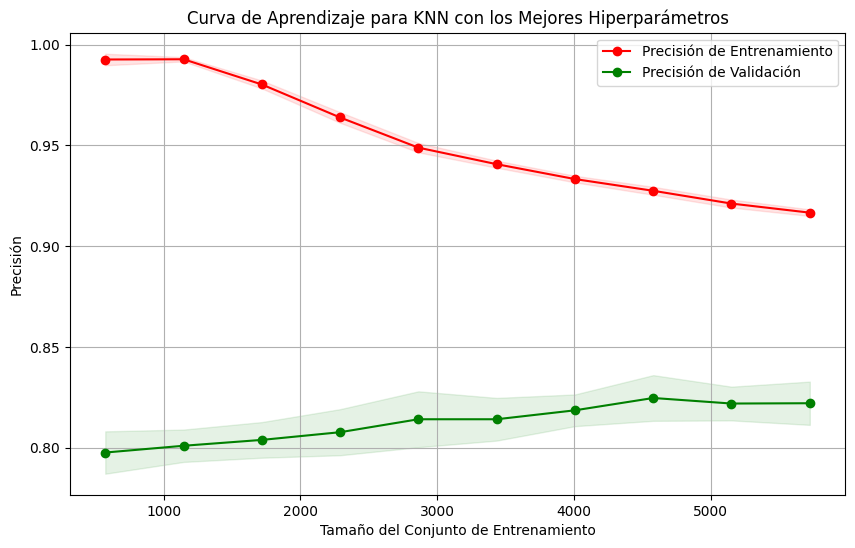

In [54]:
best_model = algoritmo_elegido.best_estimator_

train_sizes, train_scores, test_scores = learning_curve(
    estimator=best_model,
    X=x,
    y=y,
    cv=skfold_outer,
    scoring='accuracy',
    n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 10),
    verbose=2
)

train_scores_mean = train_scores.mean(axis=1)
train_scores_std = train_scores.std(axis=1)
test_scores_mean = test_scores.mean(axis=1)
test_scores_std = test_scores.std(axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Precisión de Entrenamiento")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Precisión de Validación")

plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1, color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")

plt.title("Curva de Aprendizaje para KNN con los Mejores Hiperparámetros")
plt.xlabel("Tamaño del Conjunto de Entrenamiento")
plt.ylabel("Precisión")
plt.legend(loc="best")
plt.grid()
plt.show()

El modelo no sufre de underfitting ni overfitting. Las curvas de aprendizaje indican que el rendimiento del modelo se estabiliza a medida que aumenta el tamaño del conjunto de entrenamiento, lo que sugiere que está generalizando bien a datos no vistos

# Matriz de confusion

Fitting 8 folds for each of 9 candidates, totalling 72 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
Fitting 8 folds for each of 9 candidates, totalling 72 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
Fitting 8 folds for each of 9 candidates, totalling 72 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
Fitting 8 folds for each of 9 candidates, totalling 72 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
Fitting 8 folds for each of 9 candidates, totalling 72 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
Fitting 8 folds for each of 9 candidates, totalling 72 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
Fitting 8 folds for each of 9 candidates, totalling 72 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
Fitting 8 folds for 

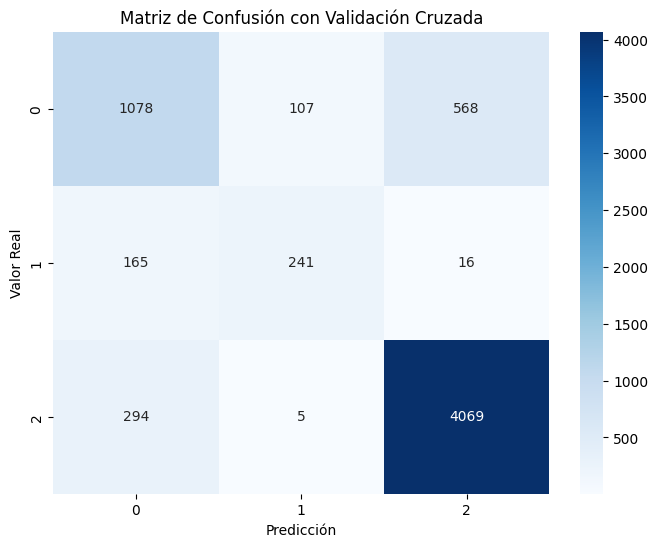

In [71]:
y_pred_cv = cross_val_predict(algoritmo_elegido, x, y, cv=8)

matriz_confusion_cv_2 = confusion_matrix(y, y_pred_cv)

plt.figure(figsize=(8, 6))
sns.heatmap(matriz_confusion_cv_2, annot=True, fmt='d', cmap='Blues')
plt.title('Matriz de Confusión con Validación Cruzada')
plt.xlabel('Predicción')
plt.ylabel('Valor Real')
plt.show()

- ***Interpretación de la Matriz*** :

***Clase 0 (Churned)*** :

- Verdaderos Positivos (VP): 1078 (predichos correctamente como 0).

- Falsos Positivos (FP): 107 + 568 = 675 (predichos incorrectamente como 0 cuando eran 1 o 2).

- Falsos Negativos (FN): 165 + 294 = 459 (predichos incorrectamente como 1 o 2 cuando eran 0).

- Verdaderos Negativos (VN): Todas las instancias que no pertenecen a una clase específica y que fueron clasificadas correctamente como otra clase distinta, es decir: 241 + 4069 = 4310.

***Clase 1 (Joined)***:

- Verdaderos Positivos (VP): 241 (predichos correctamente como 1).

- Falsos Positivos (FP): 165 + 16 = 181 (predichos incorrectamente como 1 cuando eran 0 o 2).

- Falsos Negativos (FN): 107 + 5 = 112 (predichos incorrectamente como 0 o 2 cuando eran 1).

- Verdaderos Negativos (VN): 1078 + 4069 = 5147.

***Clase 2 (Stayed)***:

- Verdaderos Positivos (VP): 4069 (predichos correctamente como 2).

- Falsos Positivos (FP): 294 + 5 = 299 (predichos incorrectamente como 2 cuando eran 0 o 1).

- Falsos Negativos (FN): 568 + 16 = 584 (predichos incorrectamente como 0 o 1 cuando eran 2).

- Verdaderos Negativos (VN): 241 + 1078 = 1319.


Este modelo presenta un desempeño excelente en términos de precisión y equilibrio entre clases. La cantidad de errores es mínima, lo que demuestra que el modelo es lo suficientemente robusto como para manejar datos nuevos con alta precisión. Esto indica que podría aplicarse de manera efectiva en un entorno de produccion.

# Se guarda el Mejor modelo

In [56]:
filename = '/content/drive/My Drive/Lgbm_Telecomunicacion.sav'
joblib.dump(best_model, filename)

['/content/drive/My Drive/Lgbm_Telecomunicacion.sav']

# *Produccion*

In [66]:
y_testeo = datos_testeo['Customer Status']
x_testeo = datos_testeo.drop(['Customer Status'], axis = 1)

In [72]:
filename = '/content/drive/My Drive/Lgbm_Telecomunicacion.sav'
loaded_model = joblib.load(filename)

# Realizar las predicciones
predicciones = loaded_model.predict(x_testeo)

# Calcular el accuracy
accuracy = accuracy_score(y_testeo, predicciones)

# Imprimir el resultado del accuracy
print(f"Accuracy del modelo en produccion: {accuracy:.2f}")

Accuracy del modelo en produccion: 0.87


LightGBM logra adaptarse de manera asertiva a nuevos datos gracias a una combinación de factores: su estructura basada en árboles de decisión, su algoritmo de optimización, sus técnicas de regularización y su eficiencia. Estas características hacen que logre adaptarse de manera asertiva a la hora de realizar predicciones con datos con los cuales nunca fue entrenado.